### REAL ESTATE AGENT ########################

Steps to build the agent:

1. Use LLM to generate listings
2. Question about client preferences, life-style, etc
3. Use LLM to generate a description of an ideal apartment
4. Query listings using vector search (embeddings to find the apartments)
5. Filter by some hard constraings (such as number of rooms)
6. Present the final listing adapting the description to the user preferences

Tests:

To evaluate the agent we will run two scenarios:
1. Family with kids looking for calm places
2. Single person looking for vibrant places

In [1]:
!pip install -qU numpy
!pip install -qU openai
!pip install -qU langchain-openai
!pip install -U --quiet lancedb pandas pydantic
!pip install pylance
!pip install --quiet datasets transformers clip


[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


In [2]:
# loading environment variables (copy .env.dist to .env. and update OPEN_AI api key there)
from dotenv import load_dotenv
load_dotenv()  

True

In [3]:
import os
from langchain.prompts import PromptTemplate
from langchain.chat_models import ChatOpenAI 
import openai

client = openai.OpenAI(
    base_url = os.environ.get('BASE_URL'),
    api_key = os.environ.get('API_KEY')
)

llm = ChatOpenAI(model="gpt-3.5-turbo", temperature=0, api_key=os.environ["API_KEY"], base_url=os.environ.get('BASE_URL'))

/var/folders/2z/b4b21nyd0jxcp1kh766nw8hm0000gp/T/ipykernel_25426/2599882028.py:11: LangChainDeprecationWarning: The class `ChatOpenAI` was deprecated in LangChain 0.0.10 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import ChatOpenAI``.
  llm = ChatOpenAI(model="gpt-3.5-turbo", temperature=0, api_key=os.environ["API_KEY"], base_url=os.environ.get('BASE_URL'))


In [4]:
import json

if not os.path.exists('listings.json'):
    response = llm.invoke(f"Generate 10 real estate listings for houses in the city of Porto, Portugal, the listing should include the following fields: price, number_of_bedrooms, square_footage, description and neighborhood_description, the format should be a JSON")

    listings = json.loads(response.content)
    with open('listings.json', 'w') as f:
        json.dump(listings, f)
else:
    with open('listings.json', 'r') as f:
        listings = json.load(f)


Listings images already created


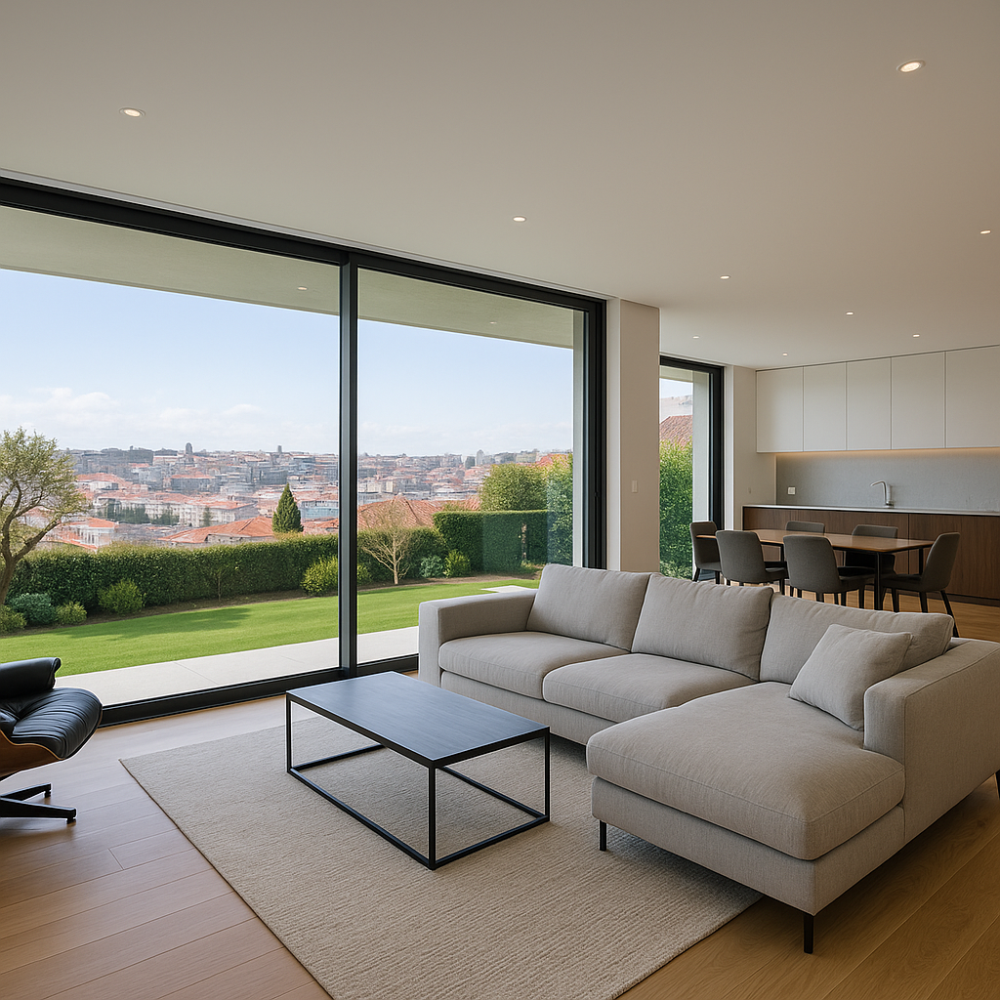

In [5]:
import base64
from PIL import Image

if (len(os.listdir('listings_images')) != len(listings)):  
    for i in range(len(listings)):
        listing = listings[i]
        prompt = f"Generate a realistic internal image for this listing in Porto City: {listing}"

        # Use OpenAI's image generation endpoint (DALL·E)
        img = client.images.generate(
            model="gpt-image-1",
            prompt=prompt,
            n=1,
            size="1024x1024"
        )

        image_bytes = base64.b64decode(img.data[0].b64_json)
        with open(f"listings_images/output_{i}.png", "wb") as f:
            f.write(image_bytes)
else:
    print('Listings images already created')

Image.open("listings_images/output_0.png")  # Display the first image as an example

Define the base questionnarie and fill the awnsers for the first scenario: Family with kids looking for calm places.

In [6]:
# questions to ask the user about their personal preferences
personal_questions = [  "Do you work in person or remotely?",
                        "Do you have kids?",
                        "Do you prefer vibrant neighborhoods or calm places?",
                        "Do you like to cook in your free time?",
                        "Do you prefer to spend time indoors or outdoors?",
                        "Describe how your perfect apartment interior would be.",
                        "What is your budget limit (in euros)?",
                       ]

# personal_answers = [ ] 
# for question in personal_questions:
#    answer = input(question)
#    personal_answers.append(answer)
    
# list of your personal answers to the questions above
# first scenario: family with kids
personal_answers = ['Remotely', 'Yes', 'Calm', 'Yes, I love!', 'Indoors', 'Spacious and bright with a large kitchen, perfect for family gatherings.', '400000']

In [43]:
def fill_questionaire(personal_questions, personal_answers, consider_interior_description = False, consider_budget = False):
    questionnaire = ""
    for i in range(len(personal_questions[0:-2])): # avoid the last two questions (interior description and budget)
        questionnaire += personal_questions[i] + " " + personal_answers[i] + "\n"
    if consider_interior_description:
        questionnaire += personal_questions[-2] + " " + personal_answers[-2] + "\n"
    if consider_budget:
        questionnaire += personal_questions[-1] + " " + personal_answers[-1] + "\n"
    return questionnaire
questionnaire = fill_questionaire(personal_questions, personal_answers)
print(questionnaire)

Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors



Generating the prompt to translate the questionarie in a listing description. Our embedding models has a token count limitation, so we adapted the prompt to generate a short description (comparing with real_estate.ipynb).

In [35]:
prompt_target_description = PromptTemplate(
    template="{question}\n{questionnaire}",
    input_variables=["question","questionnaire"],
)
question_target_description = """
    You are a real estate agent. Based on the context provided, generate a short description (with one sentence only) of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire below. 
"""

query = prompt_target_description.format(question = question_target_description, questionnaire = questionnaire)
print(query)


    You are a real estate agent. Based on the context provided, generate a short description (with one sentence only) of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire below. 

Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors



Using the questionnarie, we will generate the description of the ideal listing for this user:

In [36]:
target_description = llm.invoke(query).content
print(target_description)

The ideal house for you is a spacious and modern home with a gourmet kitchen, located in a peaceful neighborhood perfect for relaxing and unwinding with your family.


Now it's time to create the embeddings for our vector database, we will build using listing and neighboorhood descriptions.

In [10]:
import transformers
from transformers import CLIPTokenizerFast
import torch
import numpy as np
from PIL import Image

MODEL_ID = "openai/clip-vit-base-patch32"

device = "cuda" if torch.cuda.is_available() else "cpu"
model = transformers.CLIPModel.from_pretrained(MODEL_ID).to(device)
preprocess = transformers.CLIPProcessor.from_pretrained(MODEL_ID)
tokenizer = CLIPTokenizerFast.from_pretrained(MODEL_ID)

/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/venv/lib/python3.12/site-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/venv/lib/python3.12/site-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/ven

In [11]:
import time
import torch
import numpy as np
from PIL import Image

def create_multimodal_embedding(text_description, image_path=None, image_description=None, weights=(0.6, 0.4)):
    # text embedding
    inputs = tokenizer([text_description], padding=True, return_tensors="pt").to(device)
    text_features = model.get_text_features(**inputs)
    text_embedding = text_features.detach().numpy()[0]

    # image embeddings
    if image_path is not None:
        image = preprocess(text=None, images=[Image.open(image_path)], return_tensors="pt")["pixel_values"].to(device)
        img_features = model.get_image_features(image)
        img_embedding = img_features.detach().numpy()[0]
    elif image_description is not None:
         inputs = tokenizer([image_description], padding=True, return_tensors="pt").to(device)
         img_features = model.get_text_features(**inputs)
         img_embedding = img_features.detach().numpy()[0]
    else:
        raise ValueError("Either image_path or image_description must be provided.")
    
    # combine with weights
    text_weight, image_weight = weights
    combined_embedding = (
        text_weight * text_embedding + 
        image_weight * img_embedding
    )
    
    # normalize final embedding
    combined_embedding = combined_embedding / np.linalg.norm(combined_embedding)
    
    return combined_embedding.flatten()

print(f"Total listings to process: {len(listings)}")

# Generate embeddings for all listings
print("Generating embeddings for listings...")
embeddings = []
batch_size = 10  # Process in batches to avoid rate limits

for i in range(0, len(listings), batch_size):
    batch = listings[i:i+batch_size]
    batch_texts = [listing['description'] + " " + listing['neighborhood_description'] for listing in batch]
    batch_image_paths = [f"listings_images/output_{i+j}.png" for j in range(len(batch))]
    
    try:
        batch_embeddings = []
        for j in range(len(batch)):
            batch_embeddings.append(create_multimodal_embedding(text_description=batch_texts[j], image_path=batch_image_paths[j]))

        embeddings.extend(batch_embeddings)
        
        print(f"Processed batch {i//batch_size + 1}/{(len(listings) + batch_size - 1)//batch_size}")
        
        # Small delay to respect rate limits
        time.sleep(0.1)
        
    except Exception as e:
        print(f"Error processing batch {i//batch_size + 1}: {e}")
        break

print(f"Generated {len(embeddings)} embeddings")

Total listings to process: 10
Generating embeddings for listings...
Processed batch 1/1
Generated 10 embeddings


Now we will create the lancedb table listings to save our listings along with the embeddings.

In [18]:
import lancedb

def convert_to_float(price_str):
    try:
        return float(price_str.replace("$", "").replace(",", "").replace("\u20ac", "").strip())
    except ValueError:
        return 0.0

db = lancedb.connect("./lancedb_image")

# Prepare data for LanceDB
lance_data = []
for i, listing in enumerate(listings):
    if i < len(embeddings):
        lance_data.append({
            "id": i,
            "number_of_bedrooms": listing['number_of_bedrooms'],
            "square_footage": listing['square_footage'],
            "description": listing['description'],
            "neighborhood_description": listing['neighborhood_description'],
            "price": convert_to_float(listing['price']),
            "vector": embeddings[i]
        })

print(f"Prepared {len(lance_data)} listings for LanceDB")

# Create table (drop if exists)
try:
    db.drop_table("listings")
except:
    pass

table = db.create_table("listings", lance_data)
print("Created LanceDB table with listings and embeddings")

Prepared 10 listings for LanceDB
Created LanceDB table with listings and embeddings


In [22]:
def similarity_search(table, query_text: str, query_image: str, top_k: int = 5, budget_limit: float = None):
    # Generate embedding for the query
    print(f"Searching for: '{query_text}'")

    query_embedding = create_multimodal_embedding(
        text_description=query_text, 
        image_description=query_image, 
        weights=(0.6, 0.4)
    )

    # Perform similarity search using LanceDB
    results = table.search(query_embedding).where(f"price < {budget_limit}").limit(top_k).to_pandas()

    # Format results
    search_results = []
    for _, row in results.iterrows():
        search_results.append((
            row['id'],
            row['description'] + " " + row['neighborhood_description'],
            row['price'],
            row['_distance']
        ))
    
    return search_results
        

Now we can finally search for the best listing using the target_descrition:

In [37]:
results = similarity_search(table, target_description, personal_answers[-2], top_k=3, budget_limit=float(convert_to_float(personal_answers[-1])))

print(f"\nTop 3 listings:")
for i, (listing_id, text, price, distance) in enumerate(results, 1):
    print(f"\n{i}. Listing ID: {listing_id}")
    print(f"   Price: {price}")
    print(f"   Distance: {distance:.4f}")
    print(f"   Text: {text}")
    print("-" * 80)

Searching for: 'The ideal house for you is a spacious and modern home with a gourmet kitchen, located in a peaceful neighborhood perfect for relaxing and unwinding with your family.'

Top 3 listings:

1. Listing ID: 6
   Price: 300000.0
   Distance: 0.4586
   Text: Charming and well-maintained apartment with a private garden, a spacious kitchen, and hardwood floors. Located in a family-friendly neighborhood offering many recreational parks, trendy cafes, and grocery stores.
--------------------------------------------------------------------------------

2. Listing ID: 9
   Price: 350000.0
   Distance: 0.6143
   Text: Beautifully maintained traditional townhouse with many original features in a peaceful setting. Includes a large outdoor terrace and basement storage. Situated in a charming neighborhood with lush parks, great schools, local eateries, and close to the centre.
--------------------------------------------------------------------------------

3. Listing ID: 3
   Price: 27500

This is the prompt to personalize the listing to our user:

In [44]:
prompt_final_presentation = PromptTemplate(
    template="{question}\nQUESTIONNAIRE:\n{questionnaire}\nLISTING:\n{listing}",
    input_variables=["question","questionnaire","listing"],
)
question_final_presentation = """
    You are a real estate agent that needs to present a property listing. Based on the context provided, generate the best description of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire and listing below.
"""
if results:
    listing = listings[results[0][0]]
    listing_image_path = f"listings_images/output_{results[0][0]}.png"
else:
    raise ValueError("No listings found")
query = prompt_final_presentation.format(question = question_final_presentation, questionnaire = fill_questionaire(personal_questions, personal_answers, consider_interior_description = True), listing = listing)
print(query)



    You are a real estate agent that needs to present a property listing. Based on the context provided, generate the best description of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire and listing below.

QUESTIONNAIRE:
Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors
Describe how your perfect apartment interior would be. Spacious and bright with a large kitchen, perfect for family gatherings.

LISTING:
{'price': '€300,000', 'number_of_bedrooms': 2, 'square_footage': 1600, 'description': 'Charming and well-maintained apartment with a private garden, a spacious kitchen, and hardwood floors.', 'neighborhood_description': 'Located in a family-friendly neighborhood offering many recreational parks, trendy cafes, and grocery stores.'}


And finally present the final recommendation for our family looking for a new home:

**** Welcome to your new home!******

Ideal House Description:
This charming and well-maintained apartment priced at €300,000 is perfect for you. With 2 bedrooms and a square footage of 1600, it offers a private garden, spacious kitchen, and hardwood floors. Located in a family-friendly neighborhood with many recreational parks, trendy cafes, and grocery stores, this apartment is ideal for your preference for a calm place. The spacious and bright interior with a large kitchen is perfect for family gatherings, and since you love to cook, this apartment is a great fit for you and your kids. Enjoy spending quality time indoors in this cozy and inviting space.


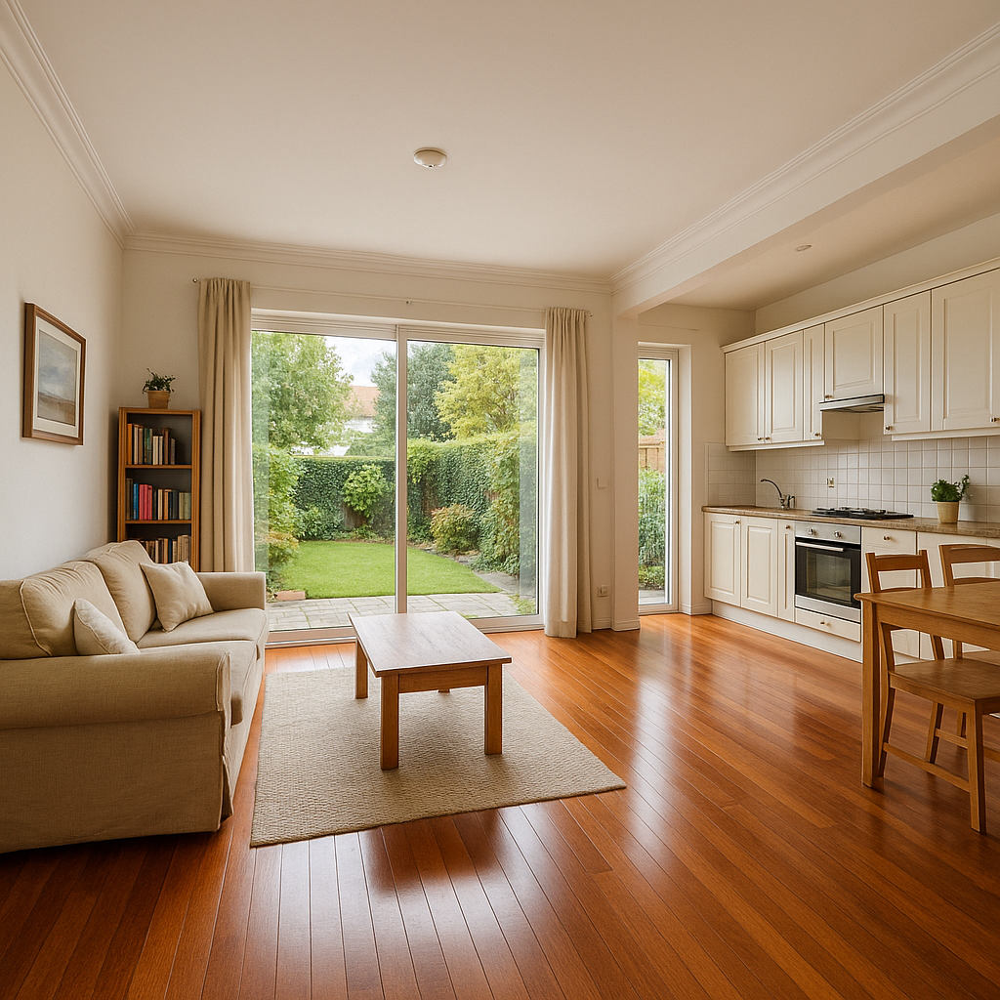

In [45]:
recommended_description = llm.invoke(query).content
print("**** Welcome to your new home!******\n")
print(recommended_description)
Image.open(listing_image_path) 

To test our agent, we will adapt the awnsers to the second scenario (Single person looking for vibrant places):

Searching for: 'Ideal house for you is a modern and vibrant urban loft with a spacious kitchen for your cooking adventures, located in a bustling neighborhood with plenty of amenities and activities nearby.'
**** Welcome to your new home!******

Based on your preferences, I have found the perfect property for you! This cozy apartment in a modern building is priced at €275,000 and offers 1 bedroom with 800 square footage. The open-plan living area and fully fitted kitchen are perfect for your love of cooking. The large windows and balcony provide stunning city views, allowing plenty of natural light to create a bright and airy interior.

Located in Porto's bustling downtown, this apartment is situated in a vibrant neighborhood with great connections to public transport, restaurants, and entertainment venues. This property is ideal for someone who works remotely, enjoys spending time indoors, and prefers a lively atmosphere. Don't miss out on this opportunity to find your perfect home!


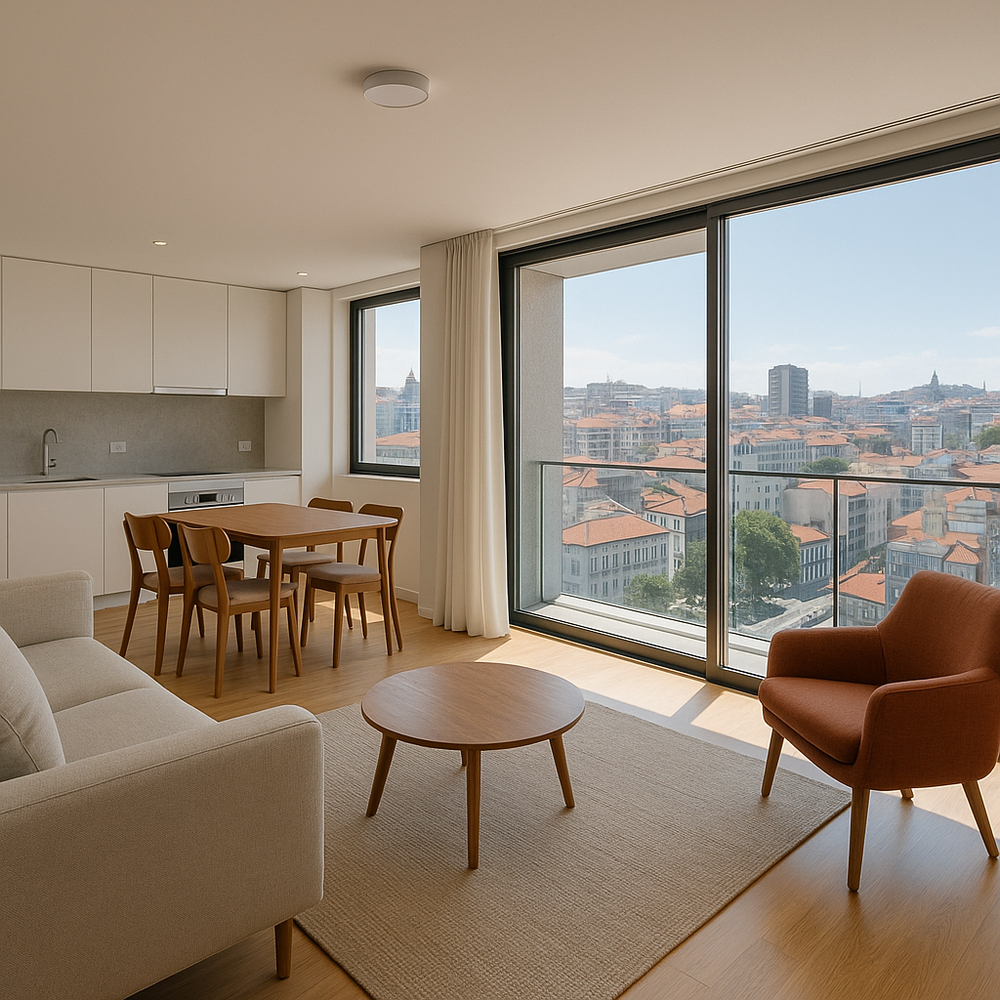

In [50]:
### Update personal_answers to test different budgets and preferences (now less money, no kids, vibrant neighborhood)
personal_answers = ['Remotely', 'No', 'Vibrant', 'Yes, I love!', 'Indoors', 'Bright and airy', '300000']

query = prompt_target_description.format(question = question_target_description, questionnaire = fill_questionaire(personal_questions, personal_answers))
target_description = llm.invoke(query).content

results = similarity_search(table, target_description, personal_answers[-2], top_k=3, budget_limit=float(convert_to_float(personal_answers[-1])))

if results:
    listing = listings[results[0][0]]
    listing_image_path = f"listings_images/output_{results[0][0]}.png"
else:
    raise ValueError("No listings found")
query = prompt_final_presentation.format(question = question_final_presentation, questionnaire = fill_questionaire(personal_questions, personal_answers, consider_interior_description=True), listing = listing)

recommended_description = llm.invoke(query).content
print("**** Welcome to your new home!******\n")
print(recommended_description)
Image.open(listing_image_path) 